# [Folium 0.7.0](https://python-visualization.github.io/folium/)

### Examples: https://github.com/python-visualization/folium/tree/master/examples

### Quick Start: http://python-visualization.github.io/folium/docs-master/quickstart.html

- folium は leaflet(js) のpython版  
- 地図可視化で柔軟な操作ができる  
- folium の日本語版チュートリアルが少ない  
- あっても、version 違いでメソットの名前が違ったりすることが多い  
- 去年（2017年）時点で version0.5.0 だったのに、最近（2018年）見たら 0.6.0 になっていた=>2018年11月に 0.7.0 になっていた  
- 参照するなら公式に限ると言われるが、folium の場合は特にそう  

<p>

- Jupyter だと実行後、即表示されるのでJupyter でやるのがオススメ  
- コマンドラインやテキストエディターでやるなら、一度htmlで保存してから、再度読み込んで表示する  

In [1]:
# install if not installed
# $ pip install folium

# upgrade if not latest edition
# $ pip install folium -U

## Getting started

In [2]:
import numpy as np
import pandas as pd

import folium
from folium import plugins
print( "folium version is {}".format(folium.__version__) )

folium version is 0.7.0


In [3]:
# You can get this sample data here:
# https://www.kaggle.com/c/recruit-restaurant-visitor-forecasting/data
data = pd.read_csv("dataset/hpg_store_info.csv")
print(data.shape)
data.head(3)

(4690, 5)


,hpg_store_id,hpg_genre_name,hpg_area_name,latitude,longitude
0,hpg_6622b62385aec8bf,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
1,hpg_e9e068dd49c5fa00,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
2,hpg_2976f7acb4b3a3bc,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221


In [4]:
LAT = data.latitude.iloc[0]
LNG = data.longitude.iloc[0]

In [5]:
m = folium.Map(location=[LAT, LNG])
# m

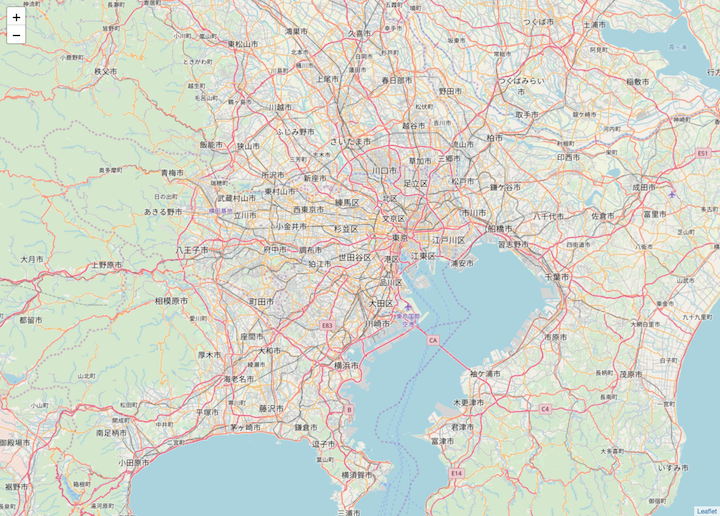

In [6]:
fp_png = 'output/map_quickstart.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

## Save

### HTML

In [7]:
filename = 'output/map.html'
m.save(filename)

### PNG

In [8]:
# 保存ファイルは 4~6MB になるので注意
# https://github.com/python-visualization/folium/issues/35#issuecomment-164784086
def save_map_png(m, fp_png):
    import os
    import time
    from selenium import webdriver

    delay=5
    fp_html ='output/map.html'
    tmpurl='file://{path}/{mapfile}'.format(path=os.getcwd(),mapfile=fp_html)
    m.save(fp_html)

    DRIVER_PATH = "{}/webDriver/chromedriver".format(os.path.expanduser('~'))
    browser = webdriver.Chrome(executable_path=DRIVER_PATH)
    browser.get(tmpurl)
    #Give the map tiles some time to load
    time.sleep(delay)
    browser.save_screenshot(fp_png)
    browser.quit()
    print("map.png saved")

In [9]:
# fp_png = 'output/map_quickstart.png'
# save_map_png(m, fp_png)

## Tile

- Tile とは地図の種類を表すベース
- デフォルトは Open Street Map というオープンライセンスの地理情報データプロジェクト
- Tile については、見比べると理解しやすい

In [10]:
m = folium.Map(location=[LAT, LNG],
               tiles='Stamen Toner',
               zoom_start=13)

# m

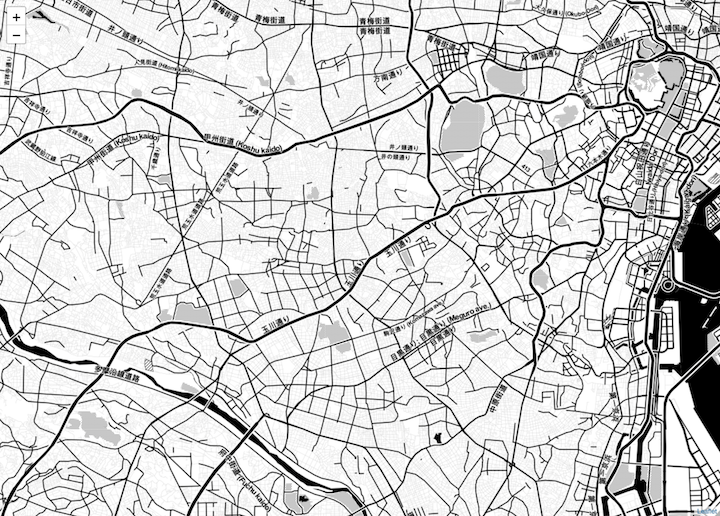

In [11]:
fp_png = 'output/map_tile_stamen-toner.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

In [12]:
m = folium.Map(location=[LAT, LNG],
               zoom_start=12,
               tiles='Stamen Terrain')

# m

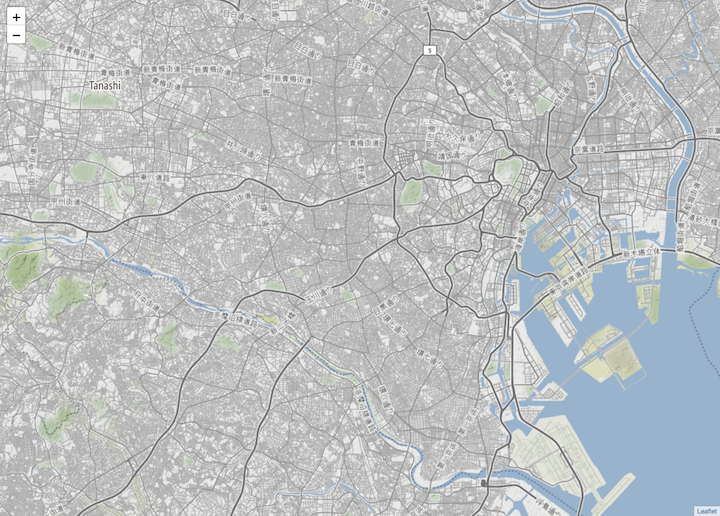

In [13]:
fp_png = 'output/map_tile_stamen-terrain.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

In [14]:
# Mapbox も API Key を渡して使用することができる。
# m = folium.Map(location=[LAT, LNG],
#                tiles='Mapbox',
#                API_key='your.API.key'
#                )

## Markers

### Simple Marker

最もシンプルなMarker
ホバーやクリックで情報を表示する設定もできる

In [15]:
m = folium.Map(location=[LAT, LNG])
folium.Marker(location = [data.latitude.iloc[100], data.longitude.iloc[100]],
                         popup = "This is Simple Marker").add_to(m)

# m

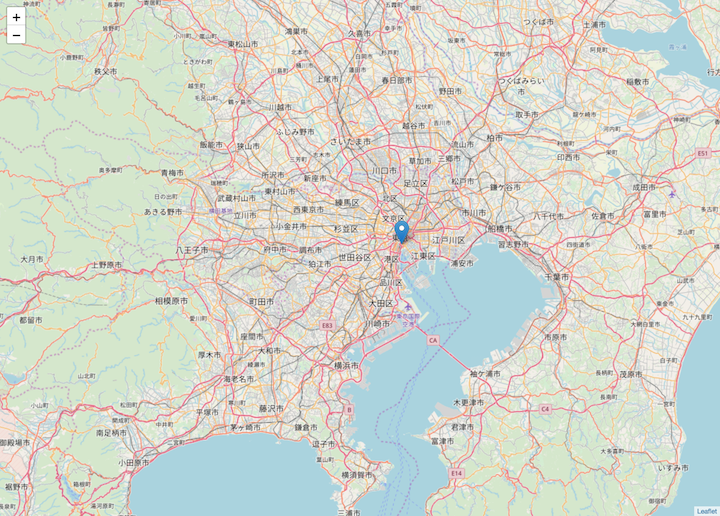

In [16]:
fp_png = 'output/map_simple-marker.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### Marker with icon

Marker の色を変えたり、アイコンを設定できたりする

In [17]:
m = folium.Map(location=[LAT, LNG])
folium.Marker(location = [data.latitude.iloc[100], data.longitude.iloc[100]],
                         popup = data.hpg_genre_name.iloc[100],
                         tooltip = "<i>"+data.hpg_area_name.iloc[100]+"</i>",  # HTMLタグも使える
                         icon=folium.Icon(color='red', icon='info-sign')  # 色やマーカーのアイコンを変更できる
                        ).add_to(m)

# m

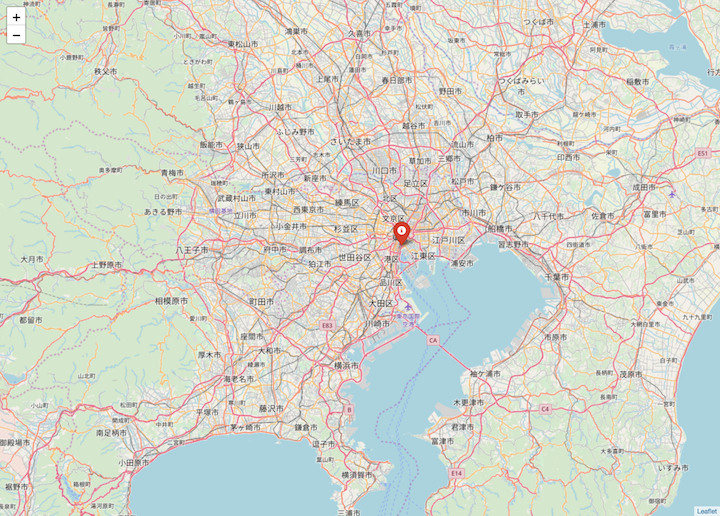

In [18]:
fp_png = 'output/map_marker-icon.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### Circle and Circle Marker

In [19]:
m = folium.Map(location=[data.latitude.iloc[0], data.longitude.iloc[0]],
               tiles='Stamen Toner',
               zoom_start=10)

folium.Circle(radius=500,
              location=[data.latitude.iloc[100], data.longitude.iloc[100]],
              popup="<b>"+data.hpg_genre_name.iloc[100]+"</b>",
              color='crimson',
              fill=False,).add_to(m)

folium.CircleMarker(location=[data.latitude.iloc[200], data.longitude.iloc[200]],
                    radius=50,
                    popup=data.hpg_genre_name.iloc[200],
                    color='#3186cc',
                    fill=True,
                    fill_color='#3186cc').add_to(m)

# m

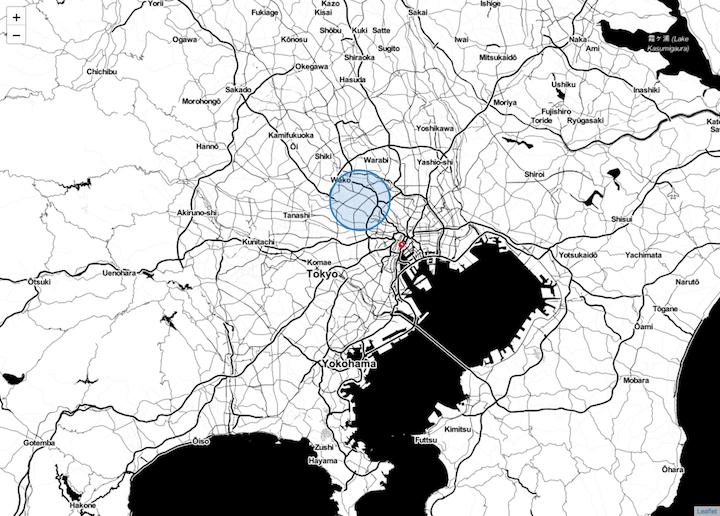

In [20]:
fp_png = 'output/map_circle.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### その他：lat/lng popovers

クリックした点の緯度経度をポップアップ表示する


In [21]:
m = folium.Map(location=[46.1991, -122.1889],
               tiles='Stamen Terrain',
               zoom_start=13)

m = m.add_child(folium.LatLngPopup())

# m

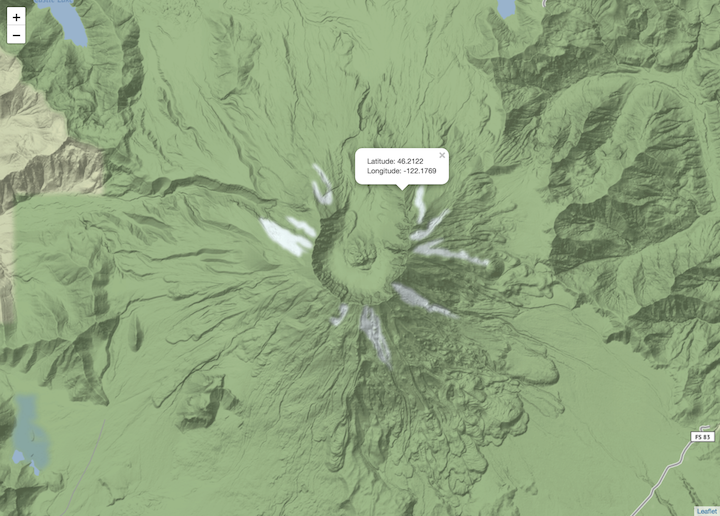

In [22]:
fp_png = 'output/map_popover.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### その他：click-for-marker

クリックした点にMarkerを生成する

In [23]:
m = folium.Map(location=[46.8527, -121.7649],
               tiles='Stamen Terrain',
               zoom_start=13)

folium.Marker([46.8354, -121.7325],
              popup='Camp Muir').add_to(m)

m = m.add_child(folium.ClickForMarker(popup='Waypoint'))

# m

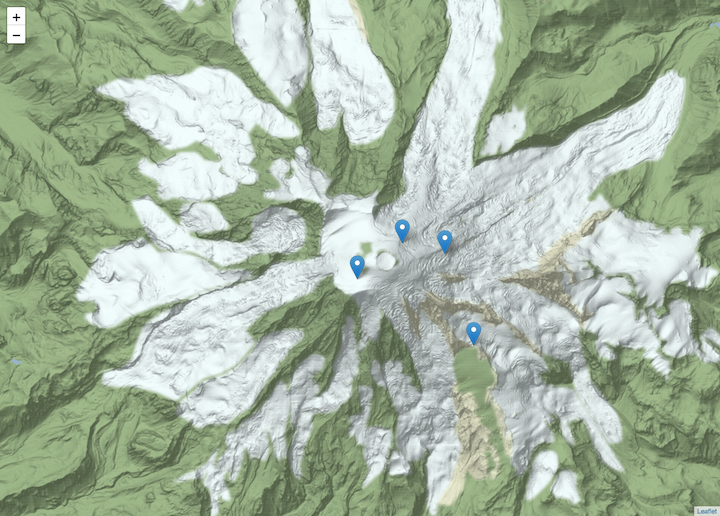

In [24]:
fp_png = 'output/map_click-for-marker.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### Vincent/Vega and Altair/VegaLite Markers

Maker に HTML を渡せるので、Marker のポップアップに出力済みのグラフを表示することもできる

In [25]:
# To Be Continued

### GeoJSON/TopoJSON Overlays

GeoJSON/TopoJSON をレイヤーとして地図上に重ねることができる
また、LayerControl メソットで、地図上で表示/非表示を操作できる

In [26]:
# To Be Continued

### Choropleth maps

- 統計区ごと（例えばUSの州）にそこの統計量を段階区分で色分けした地図であるコロプレス図も生成できる

- Pandas の DataFrame/Series のデータと、GeoJSON/TopoJSON のデータを結びつけて良い感じに色塗りしてくれる


In [27]:
# To Be Continued

### MarkerCluster

- Folium.plugins.MarkerCluster で使える  
- ドキュメント探すときは、plugins の項目内にあるので探すときに忘れないようにする  

<p>

- folium.plugins.FeatureGroupSubGroup でクラスターをグループ分けできる  

In [28]:
location = np.array([data.latitude, data.longitude]).T
location

array([[ 35.64367466, 139.66822085],
       [ 35.64367466, 139.66822085],
       [ 35.64367466, 139.66822085],
       ...,
       [ 35.69577992, 139.76845266],
       [ 35.73006827, 139.71174204],
       [ 34.70151895, 135.4988586 ]])

In [29]:
m = folium.Map([LAT, LNG], zoom_start=4)
plugins.MarkerCluster(location).add_to(m)
# m

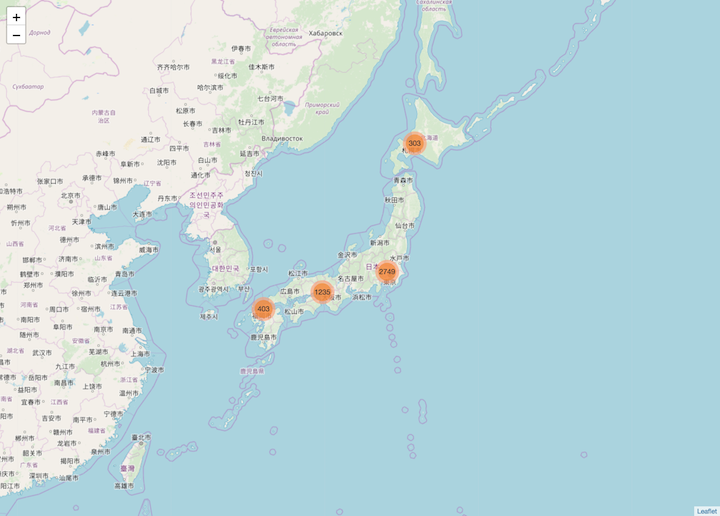

In [30]:
fp_png = 'output/map_marker-cluster.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

### FeatureGroup

In [31]:
genre_unique = np.unique(data.hpg_genre_name, return_counts=True)
np.where(genre_unique[1]>400)

(array([ 6, 11, 15]),)

In [32]:
genre_unique[0][6]

'Creation'

In [33]:
genre_unique[0][11]

'International cuisine'

In [34]:
genre_unique[0][15]

'Japanese style'

In [35]:
m = folium.Map(location=[LAT, LNG],
               zoom_start=12)

genre = 'Creation'
data_genre = data[data.hpg_genre_name == genre]
arr_creation = np.array([data_genre.latitude, data_genre.longitude]).T
feature_group_creation = folium.FeatureGroup(name=genre)
plugins.MarkerCluster(arr_creation).add_to(feature_group_creation)

genre = 'International cuisine'
data_genre = data[data.hpg_genre_name == genre]
arr_international = np.array([data_genre.latitude, data_genre.longitude]).T
feature_group_international = folium.FeatureGroup(name=genre)
plugins.MarkerCluster(arr_international).add_to(feature_group_international)

genre = 'Japanese style'
data_genre = data[data.hpg_genre_name == genre]
arr_japanese = np.array([data_genre.latitude, data_genre.longitude]).T
feature_group_japanese = folium.FeatureGroup(name=genre)
plugins.MarkerCluster(arr_japanese).add_to(feature_group_japanese)

feature_group_creation.add_to(m)
feature_group_international.add_to(m)
feature_group_japanese.add_to(m)
folium.LayerControl().add_to(m)

# m

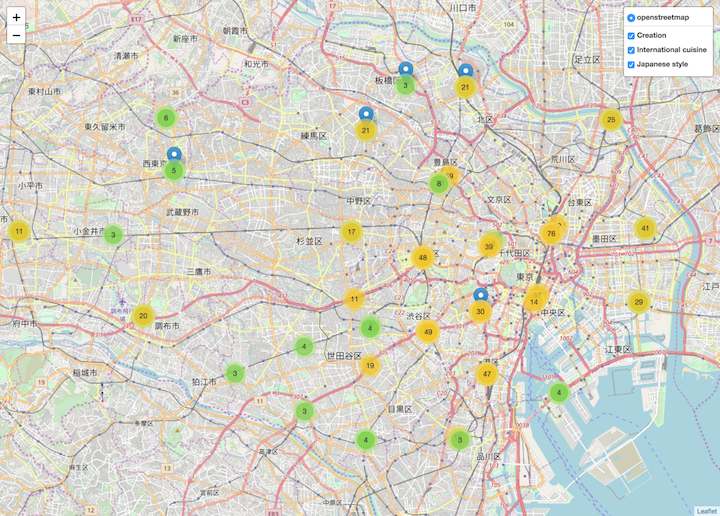

In [36]:
fp_png = 'output/map_feature-group.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

## DataFrame 内のすべての要素をプロットしたい場合

In [37]:
data.head(3)

,hpg_store_id,hpg_genre_name,hpg_area_name,latitude,longitude
0,hpg_6622b62385aec8bf,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
1,hpg_e9e068dd49c5fa00,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
2,hpg_2976f7acb4b3a3bc,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221


In [38]:
m = folium.Map(location=[LAT, LNG],
               zoom_start=10,)

data_nodup = data.drop_duplicates(subset=['latitude', 'longitude'])

for lat, lon in zip(data_nodup.latitude, data_nodup.longitude):
    folium.Marker( location = [lat, lon],
                   popup = "/".join([str(lat), str(lon)]),
                   tooltip = str(lat) + "_" + str(lon) ).add_to(m)
    
# m

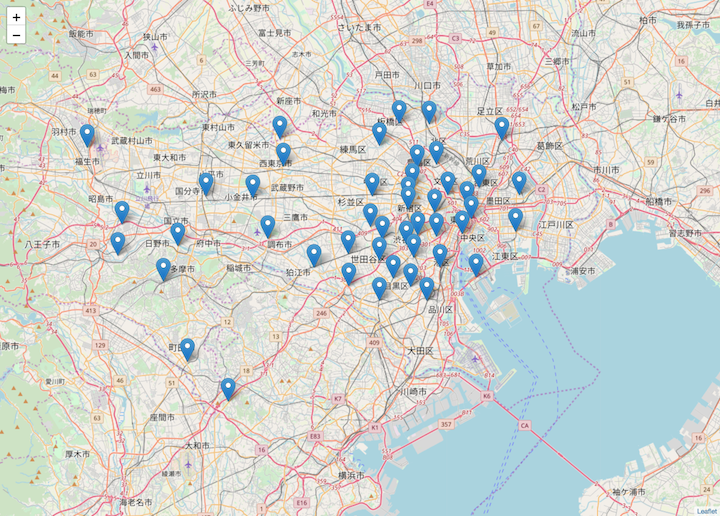

In [39]:
fp_png = 'output/map_df.png'
from IPython.display import Image, display_png
display_png(Image(fp_png))

## 注意

感覚的には、ポップアップをつけたMarkerを5000以上プロットしようとすると、固まるイメージ。
Vincent/Vega and Altair/VegaLite Markers を使用する際も、渡す地図情報のサイズを重すぎないようにすることが大事かも。
（具体的にどれくらいメモリを使っているのか、どのように処理が進んでいるのかは調べていない）

LeafletRでは、マップオブジェクトにパイプ（```%>%```）で付加情報を足していって地図を生成する
Folium の場合だと、Mapオブジェクトをはじめに定義して、その後各種要素を作って、```add_to(m)```していく

ただ、クラスターに関しては、LeafletR ではaddMarkerの引数でオプションを指定したが、
Folium ではMarkerCluster オブジェクトを別で作成して、```add_to(m)```する必要がある

LeafletR は、[kazutan さんのサイト](https://kazutan.github.io/JapanR2015/leaflet_d.html)参照